In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from plotly.subplots import make_subplots
sns.set_style('whitegrid')
plt.style.use("fivethirtyeight")

from datetime import datetime

In [2]:
stock_data = pd.read_csv('datasets/merged_stock_data.csv')

#Mag 7 list
tech_list = ['AAPL', 'GOOG', 'MSFT', 'AMZN', 'META', 'TSLA', 'NVDA']
#company_list = [AAPL, GOOG, MSFT, AMZN, META, TSLA, NVDA]
company_name = ["APPLE", "GOOGLE", "MICROSOFT", "AMAZON", "META", "TESLA", "NVIDIA"]


stock_data.head(30)

,Date,Adj Close,Close,High,Low,Open,Volume,company_name,20EMA,50SMA,RSI,VIX
0,2012-03-14 00:00:00+00:00,17.78,21.06,21.24,20.55,20.64,1418844000,AAPL,19.04,17.15,85.52,15.31
1,2012-03-15 00:00:00+00:00,17.66,20.91,21.43,20.66,21.41,1159718000,AAPL,19.21,17.27,81.25,15.42
2,2012-03-16 00:00:00+00:00,17.66,20.91,21.04,20.64,20.88,825487600,AAPL,19.38,17.39,80.61,14.47
3,2012-03-19 00:00:00+00:00,18.13,21.47,21.49,21.04,21.37,901236000,AAPL,19.58,17.52,81.71,15.04
4,2012-03-20 00:00:00+00:00,18.28,21.64,21.67,21.12,21.41,816662000,AAPL,19.77,17.65,81.32,15.58
5,2012-03-21 00:00:00+00:00,18.17,21.52,21.77,21.48,21.53,644042000,AAPL,19.94,17.78,78.22,15.13
6,2012-03-22 00:00:00+00:00,18.08,21.41,21.59,21.27,21.35,623870800,AAPL,20.08,17.91,75.72,15.57
7,2012-03-23 00:00:00+00:00,17.98,21.29,21.49,21.23,21.45,430488800,AAPL,20.19,18.03,82.57,14.82
8,2012-03-26 00:00:00+00:00,18.31,21.68,21.68,21.26,21.42,595742000,AAPL,20.33,18.17,86.68,14.26
9,2012-03-27 00:00:00+00:00,18.53,21.95,22.01,21.65,21.65,607129600,AAPL,20.49,18.31,87.52,15.59


In [3]:
stock_data.isnull().sum()

Date            0
Adj Close       0
Close           0
High            0
Low             0
Open            0
Volume          0
company_name    0
20EMA           0
50SMA           0
RSI             0
VIX             0
dtype: int64

In [4]:
stock_data.describe()

,Adj Close,Close,High,Low,Open,Volume,20EMA,50SMA,RSI,VIX
count,22130.000000,22130.000000,22130.000000,22130.000000,22130.000000,2.213000e+04,22130.000000,22130.000000,22130.000000,22130.000000
mean,92.867986,94.072352,95.243520,92.830741,94.049264,1.305326e+08,93.285650,92.059709,54.864925,17.595519
std,98.936975,99.204879,100.470072,97.882949,99.200881,1.807570e+08,98.211887,96.882493,16.745914,6.737588
min,0.260000,0.280000,0.290000,0.280000,0.290000,1.584340e+05,0.300000,0.300000,3.140000,9.140000
25%,19.420000,20.142500,20.400000,19.842500,20.130000,2.902250e+07,20.062500,19.892500,42.760000,13.250000
50%,50.265000,52.220000,52.865000,51.675000,52.320000,6.107985e+07,51.765000,50.970000,55.040000,15.760000
75%,144.822500,146.202500,147.847500,144.362500,146.007500,1.360202e+08,145.530000,144.115000,67.250000,20.030000
max,595.940000,595.940000,602.950000,589.960000,598.220000,3.692928e+09,575.000000,550.370000,99.430000,82.690000


In [5]:
stock_data['Date'] = pd.to_datetime(stock_data['Date'])
stock_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22130 entries, 0 to 22129
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype              
---  ------        --------------  -----              
 0   Date          22130 non-null  datetime64[ns, UTC]
 1   Adj Close     22130 non-null  float64            
 2   Close         22130 non-null  float64            
 3   High          22130 non-null  float64            
 4   Low           22130 non-null  float64            
 5   Open          22130 non-null  float64            
 6   Volume        22130 non-null  int64              
 7   company_name  22130 non-null  object             
 8   20EMA         22130 non-null  float64            
 9   50SMA         22130 non-null  float64            
 10  RSI           22130 non-null  float64            
 11  VIX           22130 non-null  float64            
dtypes: datetime64[ns, UTC](1), float64(9), int64(1), object(1)
memory usage: 2.0+ MB


In [6]:
stock_data.head()

,Date,Adj Close,Close,High,Low,Open,Volume,company_name,20EMA,50SMA,RSI,VIX
0,2012-03-14 00:00:00+00:00,17.78,21.06,21.24,20.55,20.64,1418844000,AAPL,19.04,17.15,85.52,15.31
1,2012-03-15 00:00:00+00:00,17.66,20.91,21.43,20.66,21.41,1159718000,AAPL,19.21,17.27,81.25,15.42
2,2012-03-16 00:00:00+00:00,17.66,20.91,21.04,20.64,20.88,825487600,AAPL,19.38,17.39,80.61,14.47
3,2012-03-19 00:00:00+00:00,18.13,21.47,21.49,21.04,21.37,901236000,AAPL,19.58,17.52,81.71,15.04
4,2012-03-20 00:00:00+00:00,18.28,21.64,21.67,21.12,21.41,816662000,AAPL,19.77,17.65,81.32,15.58


In [7]:
company_counts = stock_data.groupby('company_name').size().reset_index(name='counts')

print(company_counts)

  company_name  counts
0         AAPL    3175
1         AMZN    3175
2         GOOG    3175
3         META    3080
4         MSFT    3175
5         NVDA    3175
6         TSLA    3175


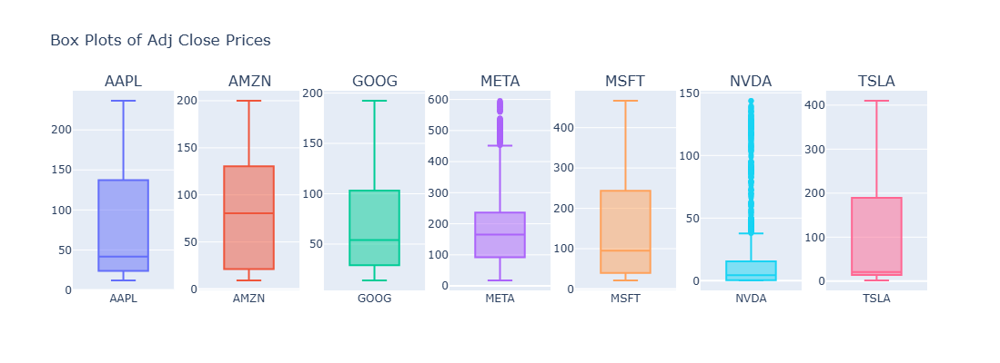

In [8]:
#plotting the distribution
def plot_adj_close_boxplot(data_fs):
    num_cols = data_fs['company_name'].unique()  # Get unique tickers
    
    fig = make_subplots(rows=1, cols=len(num_cols), 
                        subplot_titles=num_cols, 
                        vertical_spacing=0.2)

    for i, ticker in enumerate(num_cols):
        fig.add_trace(go.Box(y=data_fs[data_fs['company_name'] == ticker]['Adj Close'], 
                             name=ticker), row=1, col=i+1)

    fig.update_layout(height=400, width=1200, showlegend=False, 
                      title_text=f'Box Plots of Adj Close Prices')
    
    fig.show()


plot_adj_close_boxplot(stock_data)

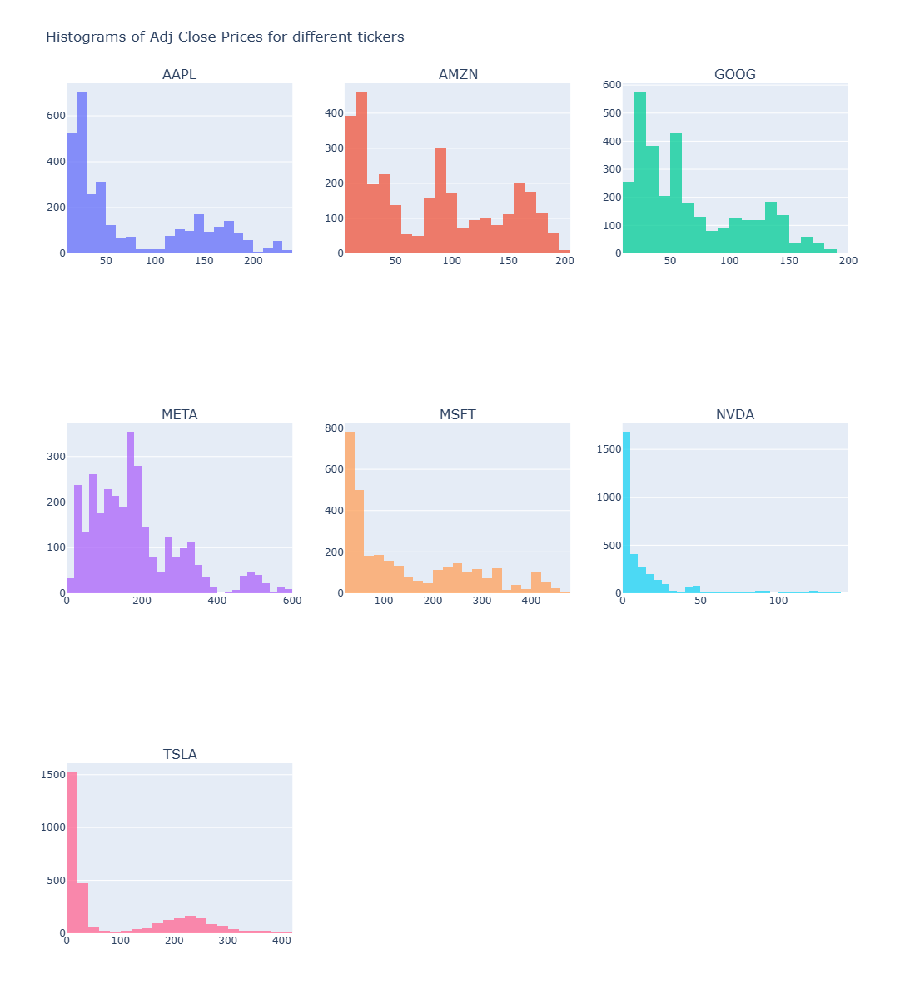

In [9]:
def plot_adj_close_histogram(data_fs, msg):
    num_cols = data_fs['company_name'].unique()  # Get unique tickers
    rows = (len(num_cols) + 2) // 3  # Calculate the number of rows needed (3 per row)
    
    fig = make_subplots(rows=rows, cols=3, 
                        subplot_titles=num_cols, 
                        vertical_spacing=0.2)

    for i, ticker in enumerate(num_cols):
        row = (i // 3) + 1  # Determine the row number
        col = (i % 3) + 1   # Determine the column number
        
        fig.add_trace(go.Histogram(x=data_fs[data_fs['company_name'] == ticker]['Adj Close'], 
                                     name=ticker, 
                                     opacity=0.75, 
                                     nbinsx=30), 
                       row=row, col=col)

    fig.update_layout(height=400 * rows, width=1200, showlegend=False, 
                      title_text=f'Histograms of Adj Close Prices {msg}')
    
    fig.show()

# Example usage
plot_adj_close_histogram(stock_data, 'for different tickers')

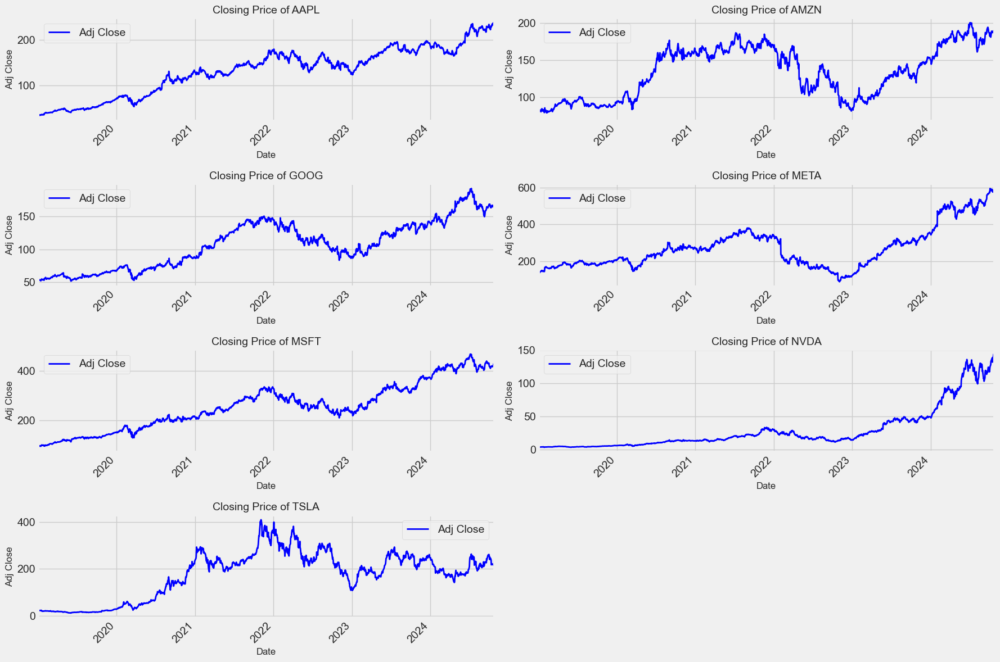

In [28]:
stock_data = stock_data[stock_data['Date'] >= '2019-01-01']

company_name = stock_data['company_name'].unique()

# Set the number of subplots based on the number of companies
num_companies = len(company_name)
cols = 2  # Number of columns in the subplot grid
rows = (num_companies + cols - 1) // cols  # Calculate rows needed

# Create the figure for the subplots
plt.figure(figsize=(18, 12))  # Increased figure size for better visibility
plt.subplots_adjust(top=0.92, bottom=0.1, left=0.1, right=0.9, hspace=0.4, wspace=0.4)  # Adjusted layout

for i, company in enumerate(company_name):
    # Filter data for the current company
    company_data = stock_data[stock_data['company_name'] == company]
    
    # Create a subplot for each company
    plt.subplot(rows, cols, i + 1)
    plt.plot(company_data['Date'], company_data['Adj Close'], label='Adj Close', color='blue', linewidth=2)  # Increased line width
    plt.ylabel('Adj Close', fontsize=12)
    plt.xlabel('Date', fontsize=12)
    plt.title(f"Closing Price of {company}", fontsize=14)

    # Format x-axis labels to show dates correctly
    plt.xticks(rotation=45, ha='right')  # Rotated and aligned x-axis labels for better readability
    plt.gca().xaxis_date()  # Automatically format x-axis as dates
    plt.gca().margins(x=0)  # Remove margins on x-axis for better fit
    plt.grid(True)  # Added grid for better readability
    plt.legend()

# Adjust layout for better spacing
plt.tight_layout()
plt.show()

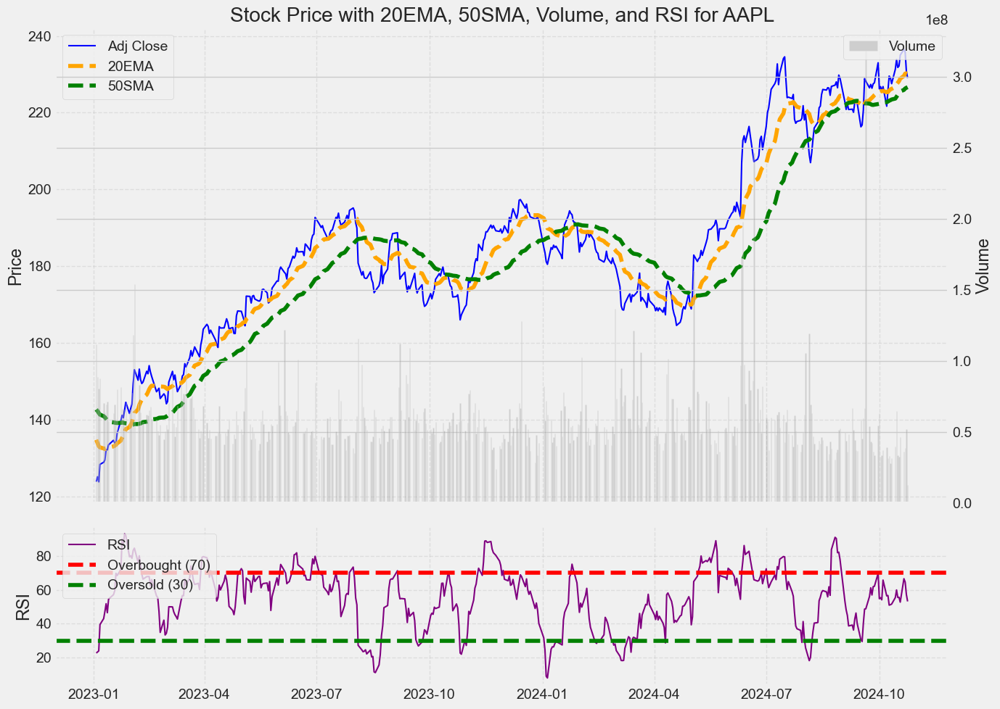

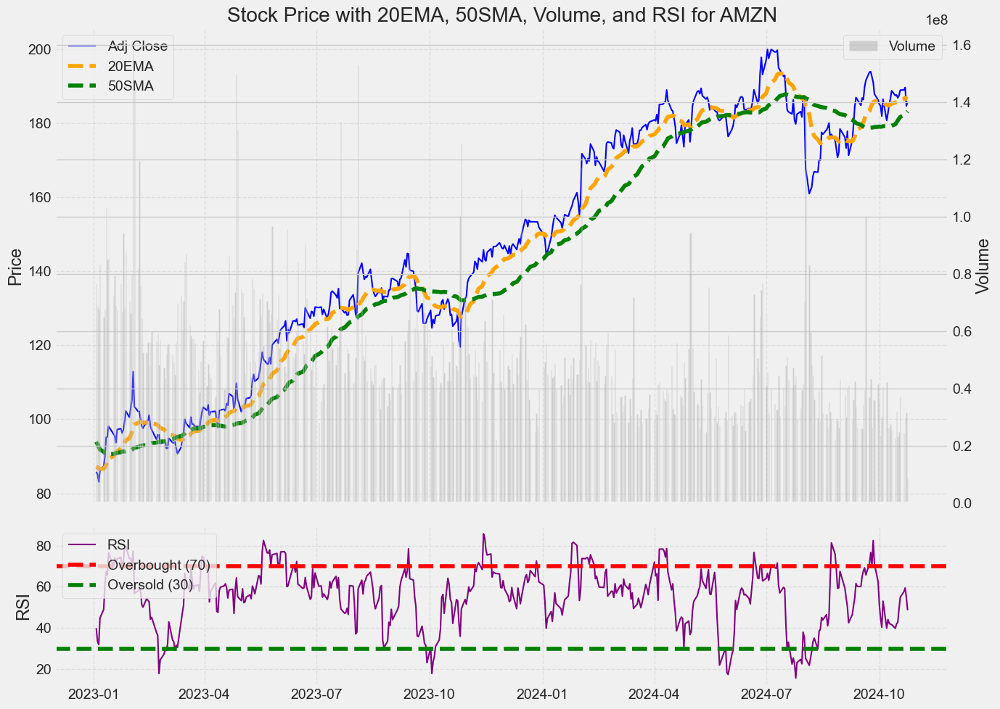

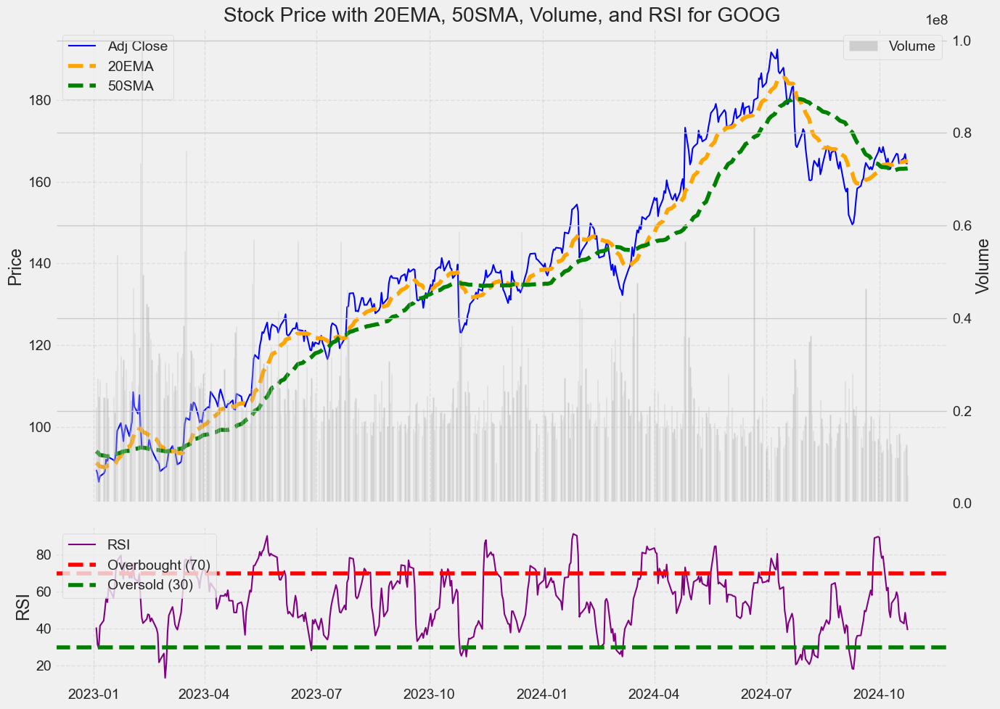

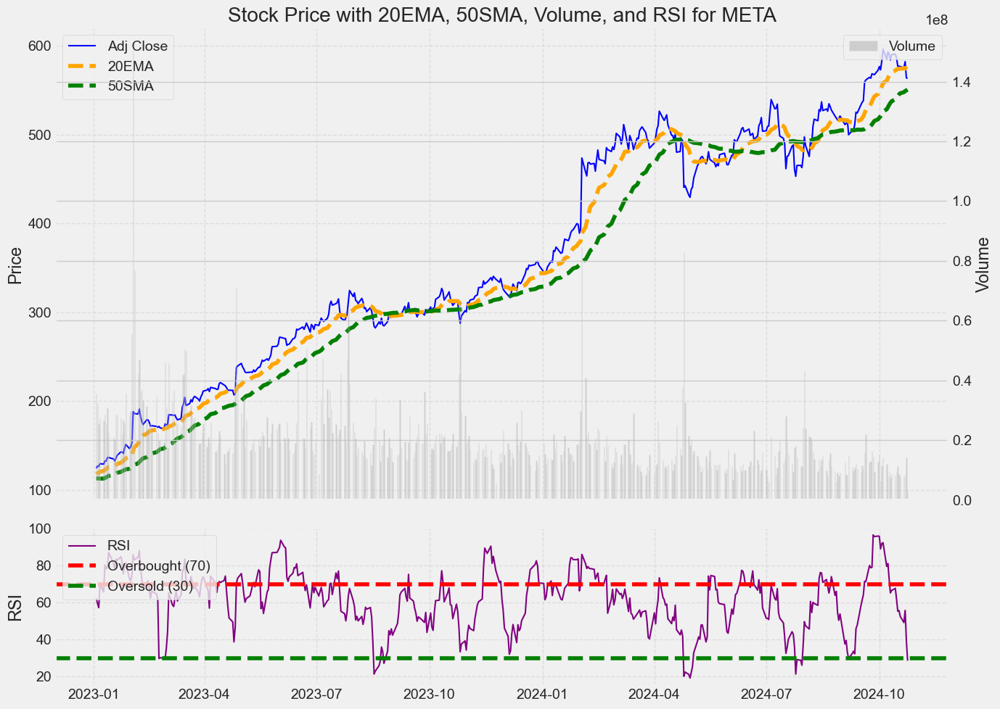

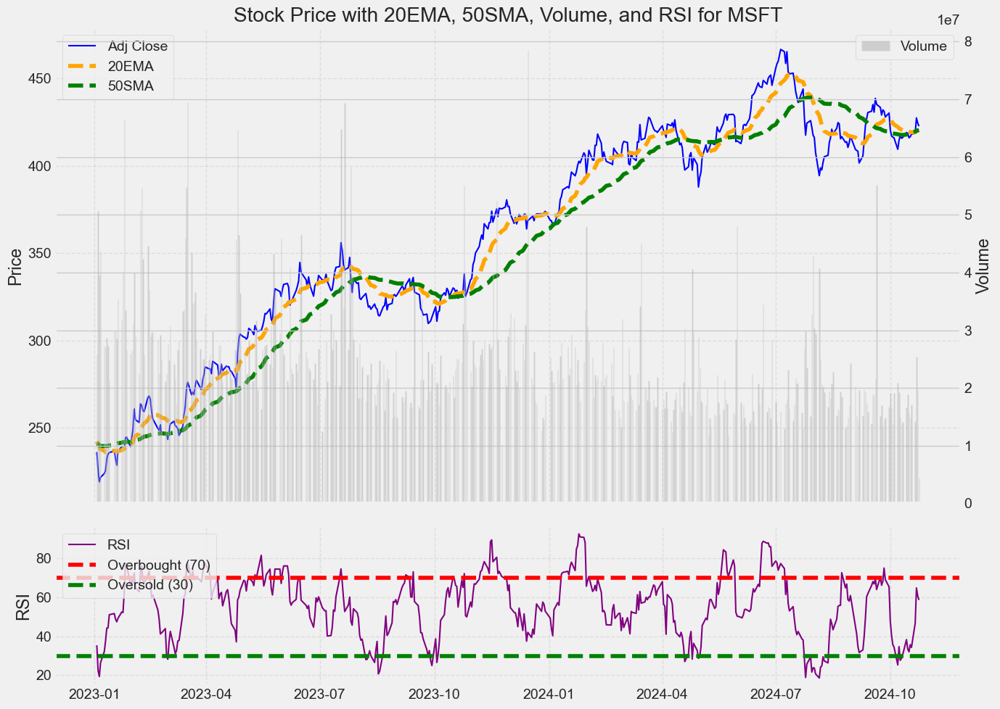

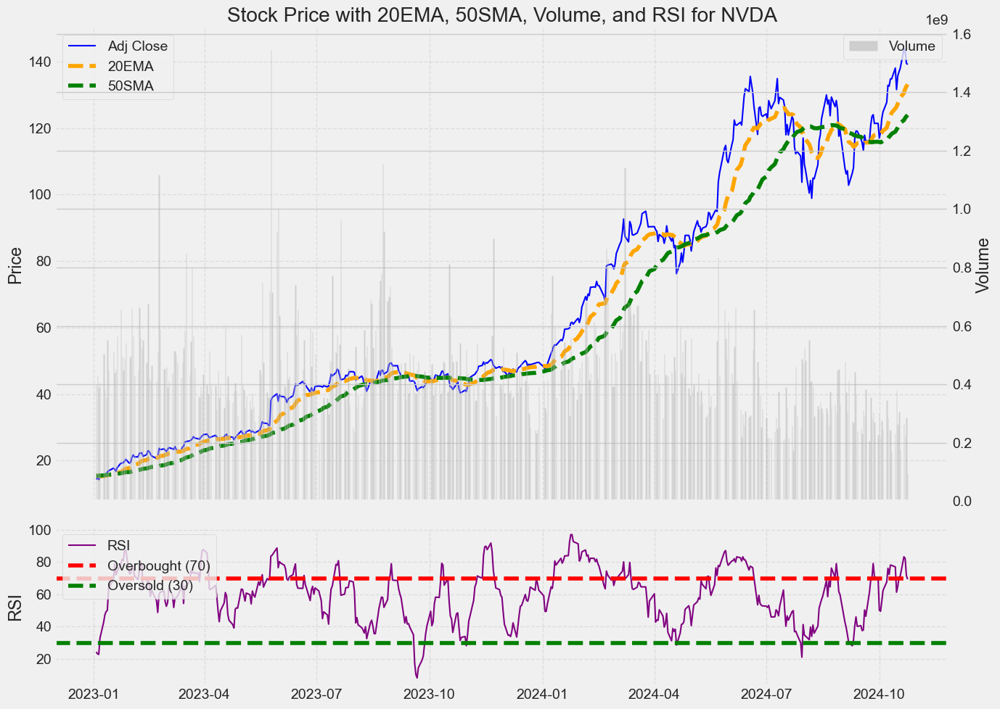

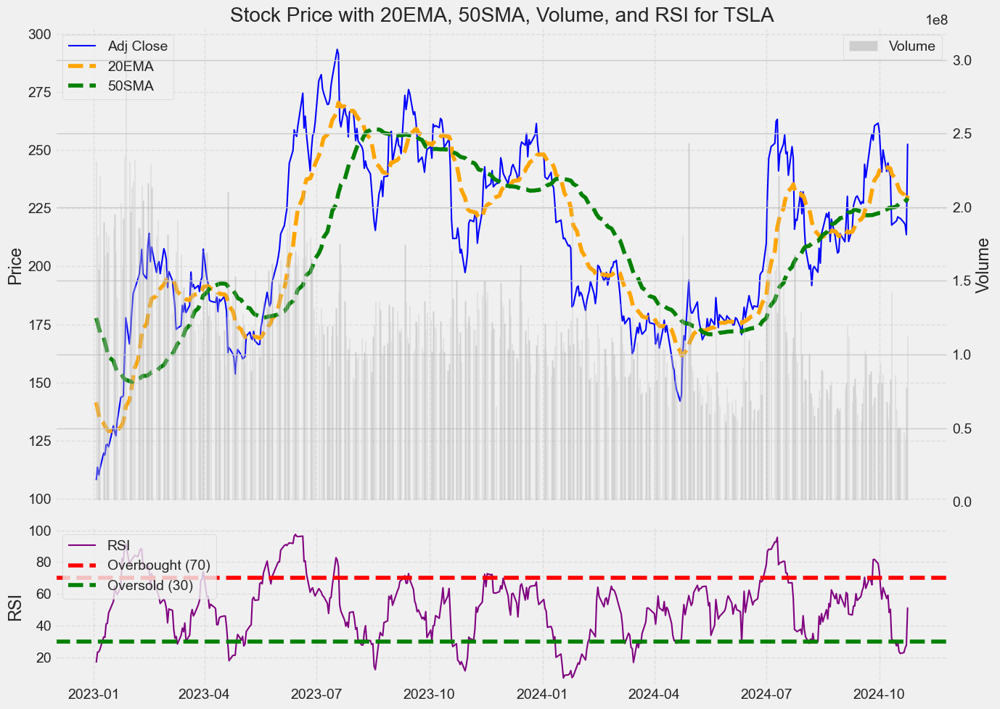

In [44]:
stock_data['Date'] = pd.to_datetime(stock_data['Date'])

# List of unique company tickers
tickers = stock_data['company_name'].unique()

# Loop through each ticker and create a separate plot with RSI as a subplot
for ticker in tickers:
    # Filter data for the current ticker and date range
    ticker_data = stock_data[(stock_data['company_name'] == ticker) & 
                             (stock_data['Date'] >= '2023-01-01') & 
                             (stock_data['Date'] <= '2024-12-31')]

    # Set up figure with two subplots: Price and RSI
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 10), gridspec_kw={'height_ratios': [3, 1]}, sharex=True)
    
    # Plot Adj Close, 20EMA, and 50SMA as line charts on the main axis (ax1)
    ax1.plot(ticker_data['Date'], ticker_data['Adj Close'], label='Adj Close', color='blue', linewidth=1.5)
    ax1.plot(ticker_data['Date'], ticker_data['20EMA'], label='20EMA', color='orange', linestyle='--')
    ax1.plot(ticker_data['Date'], ticker_data['50SMA'], label='50SMA', color='green', linestyle='--')

    # Create a secondary y-axis for Volume on ax1
    ax3 = ax1.twinx()  # Create a twin axis for volume
    ax3.bar(ticker_data['Date'], ticker_data['Volume'], color='grey', alpha=0.3, label='Volume', width=0.8)

    # Set labels and title for the main subplot (price and volume)
    ax1.set_ylabel('Price')
    ax3.set_ylabel('Volume')
    ax1.set_title(f'Stock Price with 20EMA, 50SMA, Volume, and RSI for {ticker}')

    # Set x-axis format and rotation for readability
    ax1.xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%Y-%m'))
    ax1.grid(visible=True, linestyle='--', alpha=0.5)
    plt.xticks(rotation=45)

    # Show legends
    ax1.legend(loc='upper left')
    ax3.legend(loc='upper right')

    # Plot the RSI on the second axis (ax2)
    ax2.plot(ticker_data['Date'], ticker_data['RSI'], label='RSI', color='purple', linewidth=1.5)
    ax2.axhline(70, color='red', linestyle='--', label='Overbought (70)')
    ax2.axhline(30, color='green', linestyle='--', label='Oversold (30)')
    ax2.set_ylabel('RSI')
    ax2.legend(loc='upper left')
    ax2.grid(visible=True, linestyle='--', alpha=0.5)

    # Adjust layout and show the plots
    plt.tight_layout()
    plt.show()

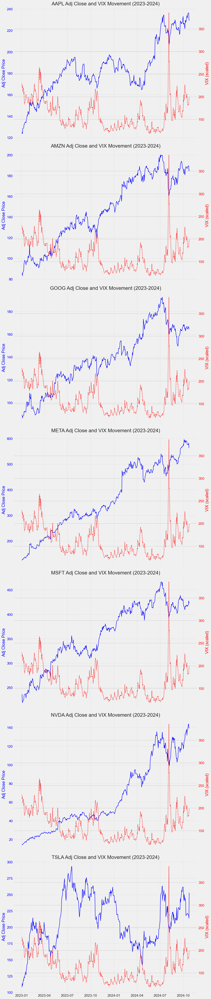

In [36]:
filtered_data = stock_data[(stock_data['Date'] >= '2023-01-01') & (stock_data['Date'] <= '2024-12-31')]

# Set up a figure with multiple subplots for each ticker
num_tickers = filtered_data['company_name'].nunique()
fig, axes = plt.subplots(num_tickers, 1, figsize=(12, 8 * num_tickers), sharex=True)
axes = axes if num_tickers > 1 else [axes]  # Handle single subplot case

# Loop through each ticker and plot it in a separate subplot
for i, ticker in enumerate(filtered_data['company_name'].unique()):
    ticker_data = filtered_data[filtered_data['company_name'] == ticker]
    
    # Plot Adj Close on primary y-axis
    axes[i].plot(ticker_data['Date'], ticker_data['Adj Close'], label=f'{ticker} Adj Close', color='blue', linewidth=1.5)
    axes[i].set_ylabel('Adj Close Price', color='blue')
    axes[i].tick_params(axis='y', labelcolor='blue')
    
    # Plot VIX on secondary y-axis with scaling factor for better visualization
    ax2 = axes[i].twinx()
    ax2.plot(ticker_data['Date'], ticker_data['VIX'] * 10, label='VIX (scaled)', color='red', linestyle='--', linewidth=1.2)
    ax2.set_ylabel('VIX (scaled)', color='red')
    ax2.tick_params(axis='y', labelcolor='red')
    
    # Set title and grid
    axes[i].set_title(f'{ticker} Adj Close and VIX Movement (2023-2024)')
    axes[i].grid(visible=True, linestyle='--', alpha=0.5)
    
    # Format x-axis for better readability
    axes[i].xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%Y-%m'))
    plt.xticks(rotation=45)

# Adjust layout to avoid overlap
plt.tight_layout()
plt.show()

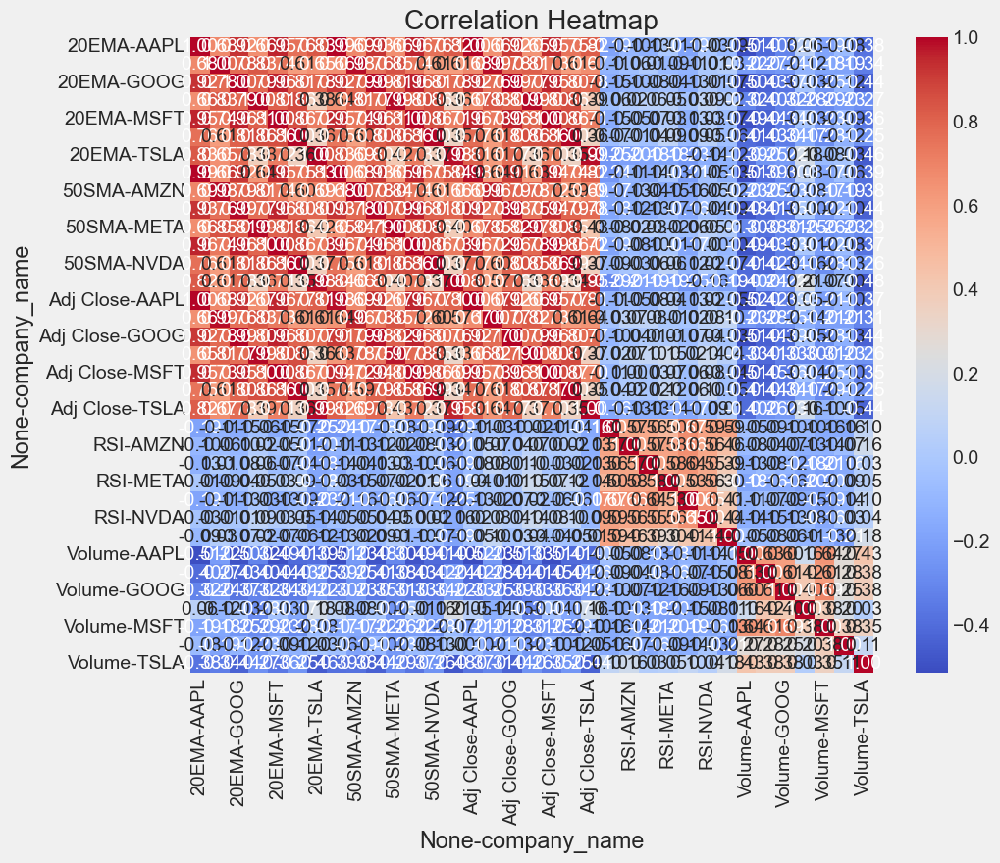

In [46]:
import seaborn as sns

# Create a DataFrame with selected variables
correlation_data = stock_data.pivot_table(values=['Adj Close', 'Volume', 'RSI', '20EMA', '50SMA'], 
                                           index='Date', 
                                           columns='company_name')
correlation = correlation_data.corr()

# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()
